In [2]:
# Librerías
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
df = pd.read_csv('../data/processed/df_listo_para_eda_rango_intermedio.csv',sep=';')
df

,CUT Comuna Origen,Comuna Origen,CUT Provincia Origen,Provincia Origen,CUT Region Origen,Region Origen,CUT Comuna Destino,Comuna Destino,Destino Turistico,CUT Provincia Destino,Provincia Destino,CUT Region Destino,Region Destino,Anio,CUT Mes,Mes,Viajes Ocasionales,Temporada,PIB Region Origen,PIB Region Destino
0,1101,Iquique,11,Iquique,1,Tarapacá,1404,Huara,Resto región Tarapacá,14,Tamarugal,1,Tarapacá,2019,1,enero,2594,Alta,1061.580205,1061.580205
1,1101,Iquique,11,Iquique,1,Tarapacá,1405,Pica,Pica,14,Tamarugal,1,Tarapacá,2019,1,enero,4138,Alta,1061.580205,1061.580205
2,1101,Iquique,11,Iquique,1,Tarapacá,2103,Sierra Gorda,Resto región Antofagasta,21,Antofagasta,2,Antofagasta,2019,1,enero,70,Alta,1061.580205,3724.530431
3,1101,Iquique,11,Iquique,1,Tarapacá,2104,Taltal,Taltal,21,Antofagasta,2,Antofagasta,2019,1,enero,106,Alta,1061.580205,3724.530431
4,1101,Iquique,11,Iquique,1,Tarapacá,2301,Tocopilla,Tocopilla,23,Tocopilla,2,Antofagasta,2019,1,enero,457,Alta,1061.580205,3724.530431
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1488829,16305,San Nicolás,163,Punilla,16,Ñuble,16202,Cobquecura,Cobquecura,162,Itata,16,Ñuble,2023,12,diciembre,96,Alta,833.567298,833.567298
1488830,16305,San Nicolás,163,Punilla,16,Ñuble,16203,Coelemu,Valle del Itata,162,Itata,16,Ñuble,2023,12,diciembre,17,Alta,833.567298,833.567298
1488831,16305,San Nicolás,163,Punilla,16,Ñuble,16302,Coihueco,Resto región Ñuble,163,Punilla,16,Ñuble,2023,12,diciembre,108,Alta,833.567298,833.567298
1488832,16305,San Nicolás,163,Punilla,16,Ñuble,16303,Ñiquén,Resto región Ñuble,163,Punilla,16,Ñuble,2023,12,diciembre,47,Alta,833.567298,833.567298


In [31]:
# Verificación de filas duplicadas
print(f'Filas Duplicadas: {df.duplicated().sum()}')

Filas Duplicadas: 0


In [32]:
# Verificación de NaNs
total_nan = df.isnull().sum().sum()
print("Total de NaN en el DataFrame:", total_nan)

Total de NaN en el DataFrame: 0


In [33]:
# Verificación de Nulos
df.isnull().sum().sort_values(ascending=False)

CUT Comuna Origen        0
Comuna Origen            0
PIB Region Origen        0
Temporada                0
Viajes Ocasionales       0
Mes                      0
CUT Mes                  0
Anio                     0
Region Destino           0
CUT Region Destino       0
Provincia Destino        0
CUT Provincia Destino    0
Destino Turistico        0
Comuna Destino           0
CUT Comuna Destino       0
Region Origen            0
CUT Region Origen        0
Provincia Origen         0
CUT Provincia Origen     0
PIB Region Destino       0
dtype: int64

In [4]:
# Factorizar las variables cátegoricas, para poder hacer matriz de correlaciónes 
df['CUT Destino Turistico'] = pd.factorize(df['Destino Turistico'])[0]
df['CUT Temporada'] = df['Temporada'].map({'Alta': 1, 'Baja': 0})

# Ordenar columnas
columnas = [
    'CUT Comuna Origen', 'Comuna Origen', 'CUT Provincia Origen', 'Provincia Origen',
    'CUT Region Origen', 'Region Origen', 'CUT Comuna Destino', 'Comuna Destino', 'CUT Destino Turistico',
    'Destino Turistico', 'CUT Provincia Destino', 'Provincia Destino', 'CUT Region Destino',
    'Region Destino', 'Anio', 'CUT Mes', 'Mes', 'Viajes Ocasionales', 'CUT Temporada', 'Temporada',
    'PIB Region Origen', 'PIB Region Destino'
]

df = df[columnas]

df.head()

,CUT Comuna Origen,Comuna Origen,CUT Provincia Origen,Provincia Origen,CUT Region Origen,Region Origen,CUT Comuna Destino,Comuna Destino,CUT Destino Turistico,Destino Turistico,...,CUT Region Destino,Region Destino,Anio,CUT Mes,Mes,Viajes Ocasionales,CUT Temporada,Temporada,PIB Region Origen,PIB Region Destino
0,1101,Iquique,11,Iquique,1,Tarapacá,1404,Huara,0,Resto región Tarapacá,...,1,Tarapacá,2019,1,enero,2594,1,Alta,1061.580205,1061.580205
1,1101,Iquique,11,Iquique,1,Tarapacá,1405,Pica,1,Pica,...,1,Tarapacá,2019,1,enero,4138,1,Alta,1061.580205,1061.580205
2,1101,Iquique,11,Iquique,1,Tarapacá,2103,Sierra Gorda,2,Resto región Antofagasta,...,2,Antofagasta,2019,1,enero,70,1,Alta,1061.580205,3724.530431
3,1101,Iquique,11,Iquique,1,Tarapacá,2104,Taltal,3,Taltal,...,2,Antofagasta,2019,1,enero,106,1,Alta,1061.580205,3724.530431
4,1101,Iquique,11,Iquique,1,Tarapacá,2301,Tocopilla,4,Tocopilla,...,2,Antofagasta,2019,1,enero,457,1,Alta,1061.580205,3724.530431


In [5]:
# Identificar columnas categóricas y numéricas
categorical_cols = df.select_dtypes(include=['object', 'category']).columns.tolist()
numerical_cols = df.select_dtypes(include=['number']).columns.tolist()

print("Columnas categóricas:", categorical_cols)
print("Cantidad de Columnas categóricas: ", len(categorical_cols))
print("Columnas numéricas:", numerical_cols)
print("Cantidad de Columnas numéricas: ", len(numerical_cols))

Columnas categóricas: ['Comuna Origen', 'Provincia Origen', 'Region Origen', 'Comuna Destino', 'Destino Turistico', 'Provincia Destino', 'Region Destino', 'Mes', 'Temporada']
Cantidad de Columnas categóricas:  9
Columnas numéricas: ['CUT Comuna Origen', 'CUT Provincia Origen', 'CUT Region Origen', 'CUT Comuna Destino', 'CUT Destino Turistico', 'CUT Provincia Destino', 'CUT Region Destino', 'Anio', 'CUT Mes', 'Viajes Ocasionales', 'CUT Temporada', 'PIB Region Origen', 'PIB Region Destino']
Cantidad de Columnas numéricas:  13


KeyboardInterrupt: 

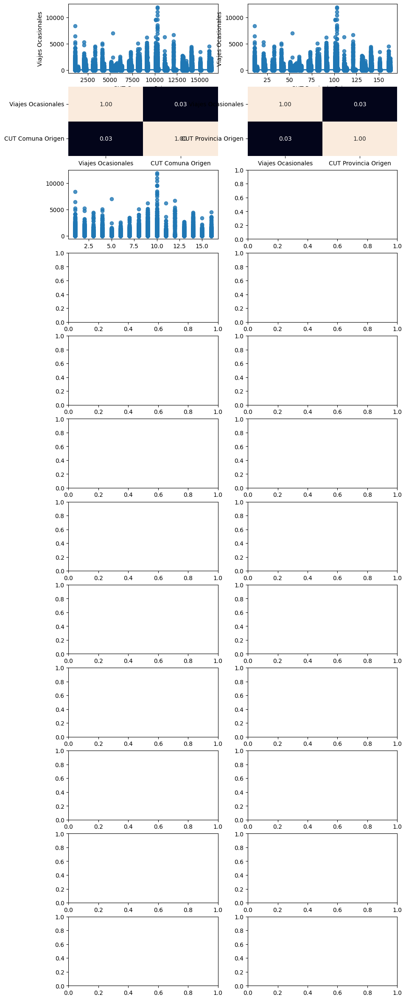

In [21]:
# Analisis Multivariante
    # Anlisis Numerico - numerico

def plot_numerical_vs_target(df, target_var):
    # Verificar que el DataFrame contiene solo variables numéricas
    if not all(df.dtypes.apply(lambda x: pd.api.types.is_numeric_dtype(x))):
        raise ValueError("El DataFrame debe contener solo variables numéricas.")

    # Verificar que la variable objetivo está en el DataFrame
    if target_var not in df.columns:
        raise ValueError(f"La variable objetivo '{target_var}' no se encuentra en el DataFrame.")

    # Obtener las variables numéricas excepto la variable objetivo
    num_vars = df.select_dtypes(include='number').columns
    num_vars = num_vars[num_vars != target_var]  # Excluir la variable objetivo

    # Calcular el número de filas necesarias para el subplot
    n_vars = len(num_vars)
    n_rows = (n_vars + 1) // 2  # Redondear hacia arriba para obtener suficientes filas

    # Crear la figura y los ejes
    fig, axis = plt.subplots(n_rows * 2, 2, figsize=(10, n_rows * 5))

    # Iterar sobre cada variable numérica y crear gráficos
    for i, var in enumerate(num_vars):
        row = i // 2 * 2  # Fila para regplot
        col = i % 2  # Columna para regplot

        # Graficar regplots
        sns.regplot(ax=axis[row, col], data=df, x=var, y=target_var)
        # Graficar heatmap
        sns.heatmap(df[[target_var, var]].corr(), annot=True, fmt='.2f', ax=axis[row + 1, col], cbar=False)

    # Eliminar ejes vacíos si hay un número impar de variables
    if n_vars % 2 != 0:
        fig.delaxes(axis[n_rows * 2 - 1, 1])

    # Ajustar el layout para evitar solapamiento
    plt.tight_layout()
    plt.show()

# Ejemplo de uso
# plot_numerical_vs_target(df, 'charges')

plot_numerical_vs_target(df[numerical_cols], 'Viajes Ocasionales')

/var/folders/3p/lzyp6b9542b_8mk_q04l5p100000gn/T/ipykernel_1152/689050785.py:14: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax2.set_xticklabels(ax2.get_xticklabels(), rotation=90)


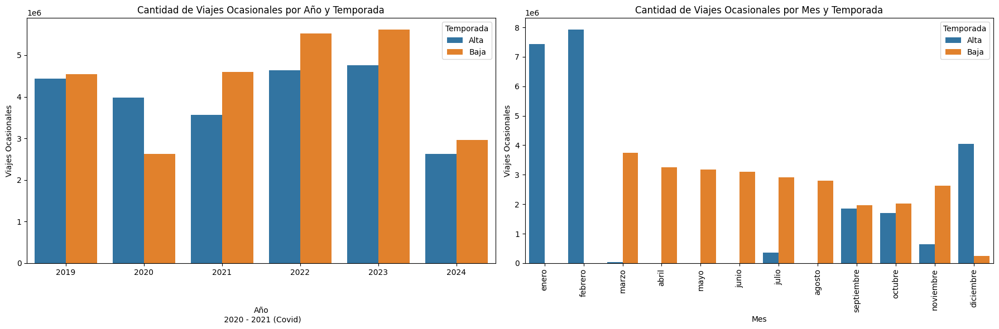

In [45]:
# Análisis Categórico-Categórico

# Creamos la figura y los subgráficos
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

# Viajes Ocasionales por Año y Temporada
viajes_por_anio_temporada = df.groupby(['Anio', 'Temporada'])['Viajes Ocasionales'].sum().reset_index()
sns.barplot(viajes_por_anio_temporada, x='Anio', y='Viajes Ocasionales', hue='Temporada', ax=ax1)
ax1.set_title("Cantidad de Viajes Ocasionales por Año y Temporada")
ax1.set_xlabel('\n\n\nAño\n 2020 - 2021 (Covid)')

# Viajes Ocasionales por Mes y Temporada
viajes_por_mes_temporada = df.groupby(['CUT Mes','Mes', 'Temporada'])['Viajes Ocasionales'].sum().reset_index().sort_values(by='CUT Mes')
sns.barplot(data=viajes_por_mes_temporada, x='Mes', y='Viajes Ocasionales', hue='Temporada', ax=ax2)
ax2.set_xticklabels(ax2.get_xticklabels(), rotation=90)
ax2.set_title("Cantidad de Viajes Ocasionales por Mes y Temporada")

plt.tight_layout()

plt.show()


In [6]:
# Diccionario de regiones de norte a sur

norte_sur = {
    15: 1,
    1: 2,
    2: 3,
    3: 4,
    4: 5,
    5: 6,
    13: 7,
    6: 8,
    7: 9,
    16: 10,
    8: 11,
    9: 12,
    14: 13,
    10: 14,
    11: 15,
    12: 16
}

# Crear la nueva columna 'Norte a Sur' usando el diccionario
df['Norte a Sur Origen'] = df['CUT Region Origen'].map(norte_sur)
df['Norte a Sur Destino'] = df['CUT Region Destino'].map(norte_sur)

/var/folders/3p/lzyp6b9542b_8mk_q04l5p100000gn/T/ipykernel_3424/1215304671.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Norte a Sur Origen'] = df['CUT Region Origen'].map(norte_sur)
/var/folders/3p/lzyp6b9542b_8mk_q04l5p100000gn/T/ipykernel_3424/1215304671.py:24: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Norte a Sur Destino'] = df['CUT Region Destino'].map(norte_sur)


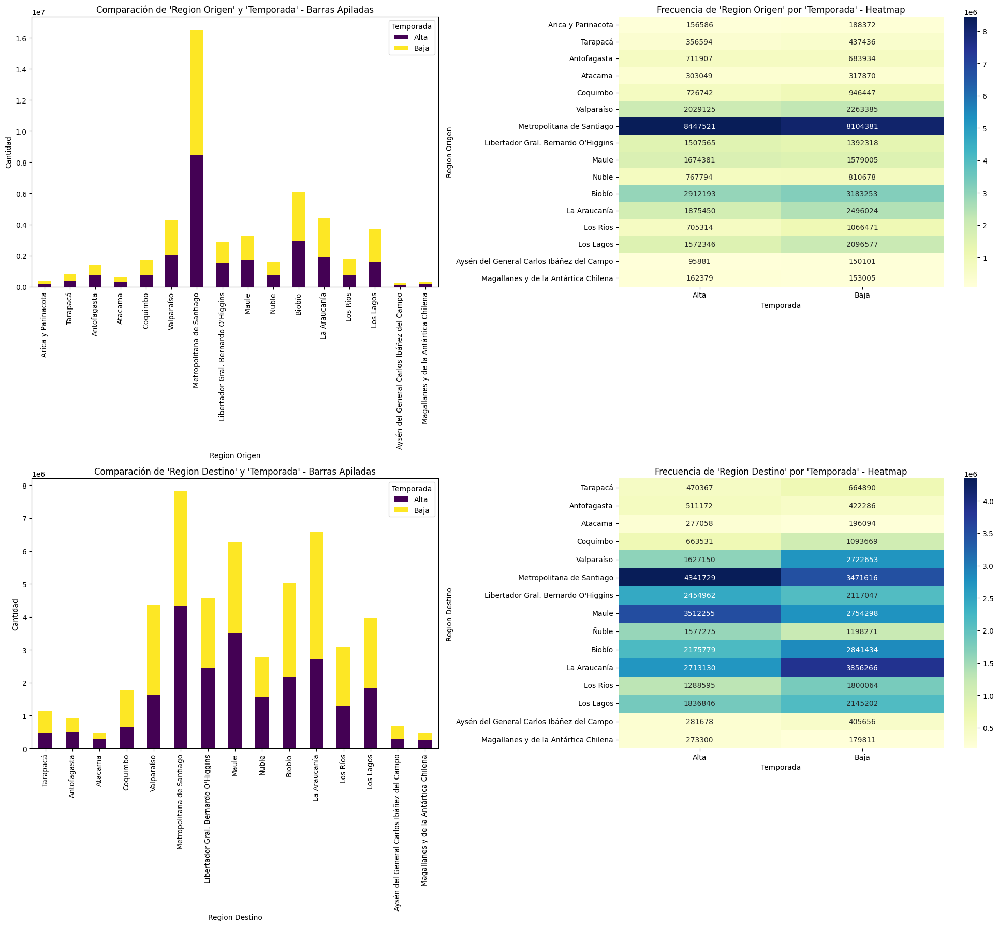

In [98]:
fig, axes = plt.subplots(2, 2, figsize=(20, 18))

# Región Origen - Temporada
df = df.sort_values(by='Norte a Sur Origen', ascending=True)
orden_regiones = df['Region Origen'].drop_duplicates().tolist()

df_pivot = df.pivot_table(values='Viajes Ocasionales', index='Region Origen', columns='Temporada', aggfunc='sum').fillna(0)
df_pivot = df_pivot.reindex(orden_regiones)
df_pivot.plot(kind='bar', stacked=True, ax=axes[0, 0], colormap='viridis')
axes[0, 0].set_title("Comparación de 'Region Origen' y 'Temporada' - Barras Apiladas")
axes[0, 0].set_xlabel("Region Origen")
axes[0, 0].set_ylabel("Cantidad")
axes[0, 0].legend(title="Temporada")

heatmap_data = df.pivot_table(values='Viajes Ocasionales', index='Region Origen', columns='Temporada', aggfunc='sum').fillna(0)
heatmap_data = heatmap_data.reindex(orden_regiones)
sns.heatmap(heatmap_data, annot=True, cmap="YlGnBu", fmt=".0f", ax=axes[0, 1])
axes[0, 1].set_title("Frecuencia de 'Region Origen' por 'Temporada' - Heatmap")
axes[0, 1].set_xlabel("Temporada")
axes[0, 1].set_ylabel("Region Origen")

# Región Destino - Temporada
df = df.sort_values(by='Norte a Sur Destino', ascending=True)
orden_regiones = df['Region Destino'].drop_duplicates().tolist()

df_pivot = df.pivot_table(values='Viajes Ocasionales', index='Region Destino', columns='Temporada', aggfunc='sum').fillna(0)
df_pivot = df_pivot.reindex(orden_regiones)
df_pivot.plot(kind='bar', stacked=True, ax=axes[1, 0], colormap='viridis')
axes[1, 0].set_title("Comparación de 'Region Destino' y 'Temporada' - Barras Apiladas")
axes[1, 0].set_xlabel("Region Destino")
axes[1, 0].set_ylabel("Cantidad")
axes[1, 0].legend(title="Temporada")

heatmap_data = df.pivot_table(values='Viajes Ocasionales', index='Region Destino', columns='Temporada', aggfunc='sum').fillna(0)
heatmap_data = heatmap_data.reindex(orden_regiones)
sns.heatmap(heatmap_data, annot=True, cmap="YlGnBu", fmt=".0f", ax=axes[1, 1])
axes[1, 1].set_title("Frecuencia de 'Region Destino' por 'Temporada' - Heatmap")
axes[1, 1].set_xlabel("Temporada")
axes[1, 1].set_ylabel("Region Destino")

plt.tight_layout()
plt.show()

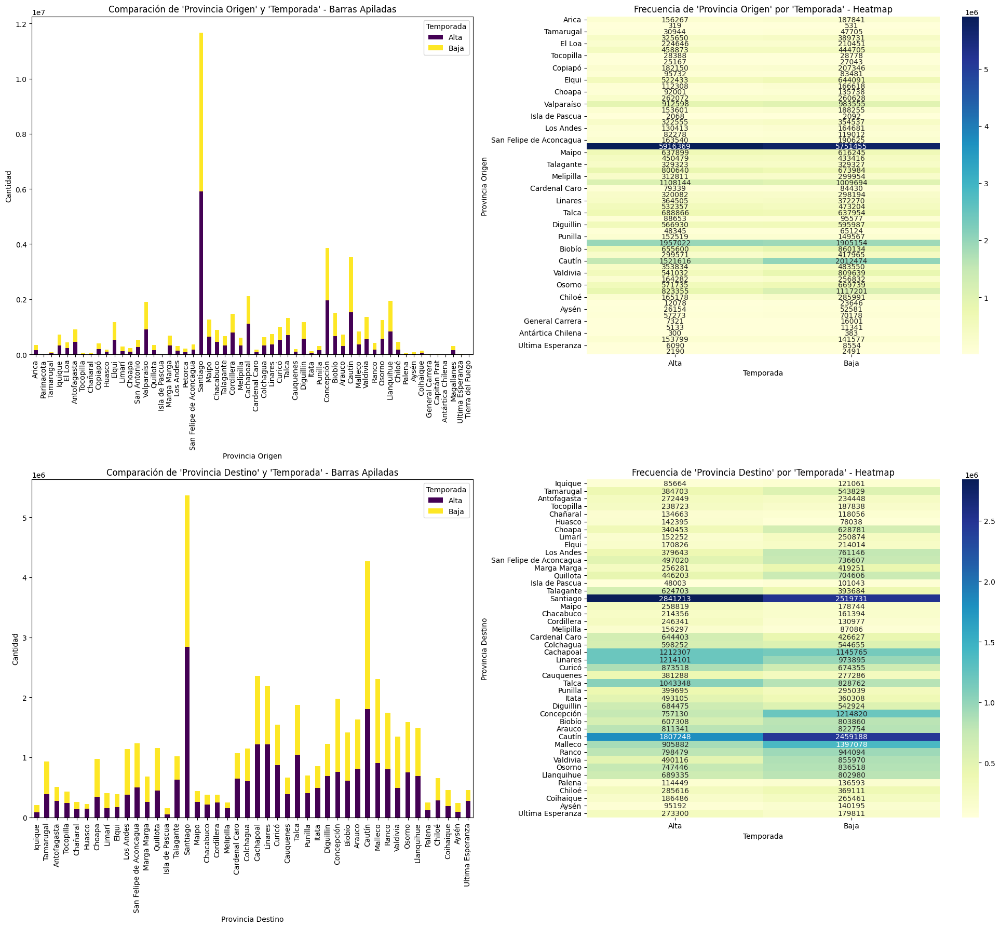

In [101]:
fig, axes = plt.subplots(2, 2, figsize=(20, 18))

# Provincia Origen - Temporada
df = df.sort_values(by='Norte a Sur Origen', ascending=True)
orden_regiones = df['Provincia Origen'].drop_duplicates().tolist()

df_pivot = df.pivot_table(values='Viajes Ocasionales', index='Provincia Origen', columns='Temporada', aggfunc='sum').fillna(0)
df_pivot = df_pivot.reindex(orden_regiones)
df_pivot.plot(kind='bar', stacked=True, ax=axes[0, 0], colormap='viridis')
axes[0, 0].set_title("Comparación de 'Provincia Origen' y 'Temporada' - Barras Apiladas")
axes[0, 0].set_xlabel("Provincia Origen")
axes[0, 0].set_ylabel("Cantidad")
axes[0, 0].legend(title="Temporada")

heatmap_data = df.pivot_table(values='Viajes Ocasionales', index='Provincia Origen', columns='Temporada', aggfunc='sum').fillna(0)
heatmap_data = heatmap_data.reindex(orden_regiones)
sns.heatmap(heatmap_data, annot=True, cmap="YlGnBu", fmt=".0f", ax=axes[0, 1])
axes[0, 1].set_title("Frecuencia de 'Provincia Origen' por 'Temporada' - Heatmap")
axes[0, 1].set_xlabel("Temporada")
axes[0, 1].set_ylabel("Provincia Origen")

# Provincia Destino - Temporada
df = df.sort_values(by='Norte a Sur Destino', ascending=True)
orden_regiones = df['Provincia Destino'].drop_duplicates().tolist()

df_pivot = df.pivot_table(values='Viajes Ocasionales', index='Provincia Destino', columns='Temporada', aggfunc='sum').fillna(0)
df_pivot = df_pivot.reindex(orden_regiones)
df_pivot.plot(kind='bar', stacked=True, ax=axes[1, 0], colormap='viridis')
axes[1, 0].set_title("Comparación de 'Provincia Destino' y 'Temporada' - Barras Apiladas")
axes[1, 0].set_xlabel("Provincia Destino")
axes[1, 0].set_ylabel("Cantidad")
axes[1, 0].legend(title="Temporada")

heatmap_data = df.pivot_table(values='Viajes Ocasionales', index='Provincia Destino', columns='Temporada', aggfunc='sum').fillna(0)
heatmap_data = heatmap_data.reindex(orden_regiones)
sns.heatmap(heatmap_data, annot=True, cmap="YlGnBu", fmt=".0f", ax=axes[1, 1])
axes[1, 1].set_title("Frecuencia de 'Provincia Destino' por 'Temporada' - Heatmap")
axes[1, 1].set_xlabel("Temporada")
axes[1, 1].set_ylabel("Provincia Destino")

plt.tight_layout()
plt.show()

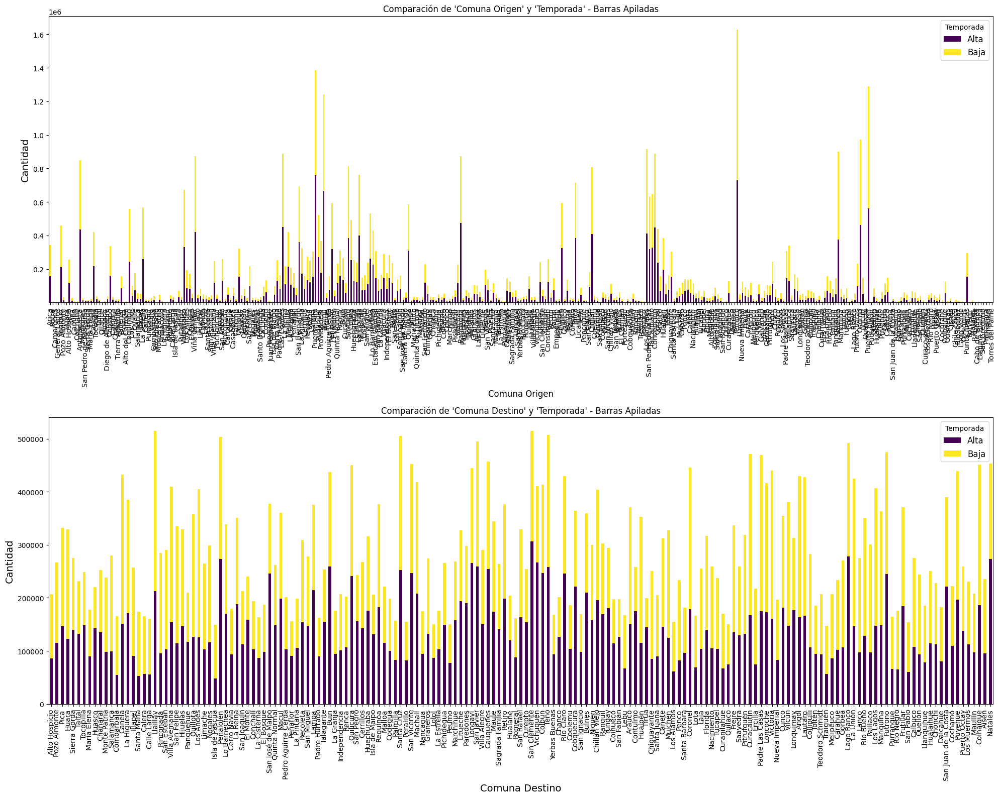

In [102]:
fig, axes = plt.subplots(2, 1, figsize=(20, 16))

# Comuna Origen - Temporada
df = df.sort_values(by='Norte a Sur Origen', ascending=True)
orden_regiones = df['Comuna Origen'].drop_duplicates().tolist()

df_pivot = df.pivot_table(values='Viajes Ocasionales', index='Comuna Origen', columns='Temporada', aggfunc='sum').fillna(0)
df_pivot = df_pivot.reindex(orden_regiones)
df_pivot.plot(kind='bar', stacked=True, ax=axes[0], colormap='viridis')
axes[0].set_title("Comparación de 'Comuna Origen' y 'Temporada' - Barras Apiladas")
axes[0].set_xlabel('Comuna Origen', fontsize=12) 
axes[0].set_ylabel("Cantidad", fontsize=14)
axes[0].legend(title="Temporada", fontsize=12)

# Comuna Destino - Temporada
df = df.sort_values(by='Norte a Sur Destino', ascending=True)
orden_regiones = df['Comuna Destino'].drop_duplicates().tolist()

df_pivot = df.pivot_table(values='Viajes Ocasionales', index='Comuna Destino', columns='Temporada', aggfunc='sum').fillna(0)
df_pivot = df_pivot.reindex(orden_regiones)
df_pivot.plot(kind='bar', stacked=True, ax=axes[1], colormap='viridis')
axes[1].set_title("Comparación de 'Comuna Destino' y 'Temporada' - Barras Apiladas")
axes[1].set_xlabel("Comuna Destino", fontsize=14) 
axes[1].set_ylabel("Cantidad", fontsize=14) 
axes[1].legend(title="Temporada", fontsize=12)

plt.tight_layout()
plt.show()


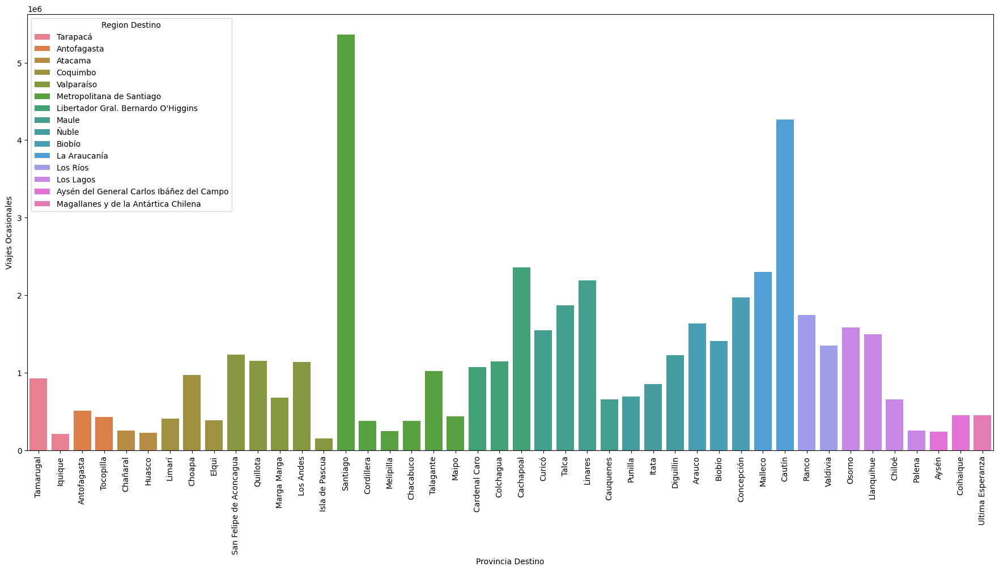

In [164]:
# Viajes Ocasionales por Provincia Destino y Region Destino
df = df.sort_values(by='Norte a Sur Destino',ascending=True)
viajes_por_provincia_region = df.groupby(['Provincia Destino', 'Region Destino','Norte a Sur Destino'])['Viajes Ocasionales'].sum().reset_index()
viajes_por_provincia_region = viajes_por_provincia_region.sort_values(by='Norte a Sur Destino')

plt.figure(figsize=(22, 10))
sns.barplot(data=viajes_por_provincia_region, x='Provincia Destino', y='Viajes Ocasionales', hue='Region Destino',order=viajes_por_provincia_region['Provincia Destino'])
plt.xticks(rotation=90)

plt.show()

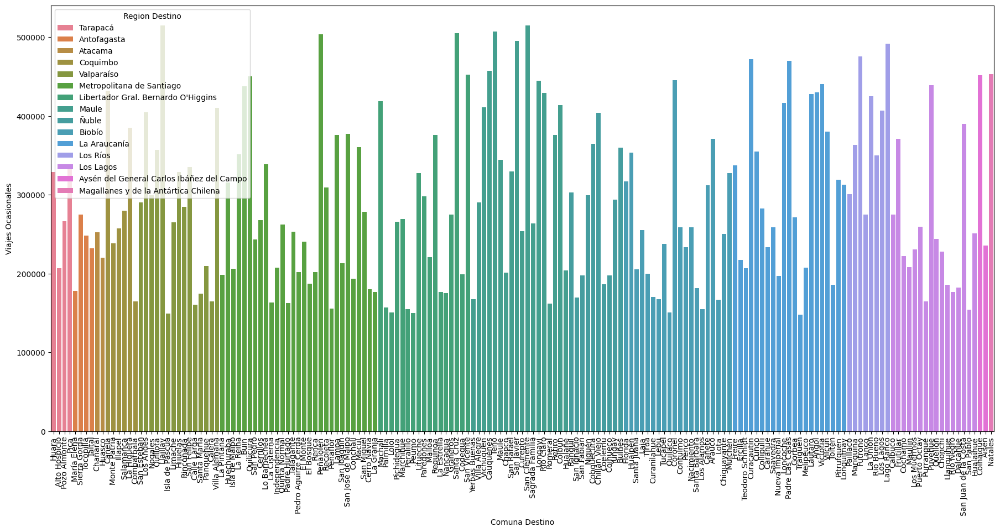

In [162]:
# Viajes Ocasionales por Comuna Destino y Region Destino
viajes_por_comuna_region = df.groupby(['Comuna Destino', 'Region Destino','Norte a Sur Destino'])['Viajes Ocasionales'].sum().reset_index()
viajes_por_comuna_region = viajes_por_comuna_region.sort_values(by='Norte a Sur Destino')

plt.figure(figsize=(22, 10))
sns.barplot(data=viajes_por_comuna_region, x='Comuna Destino', y='Viajes Ocasionales', hue='Region Destino', order=viajes_por_comuna_region['Comuna Destino'])
plt.xticks(rotation=90)


plt.show()

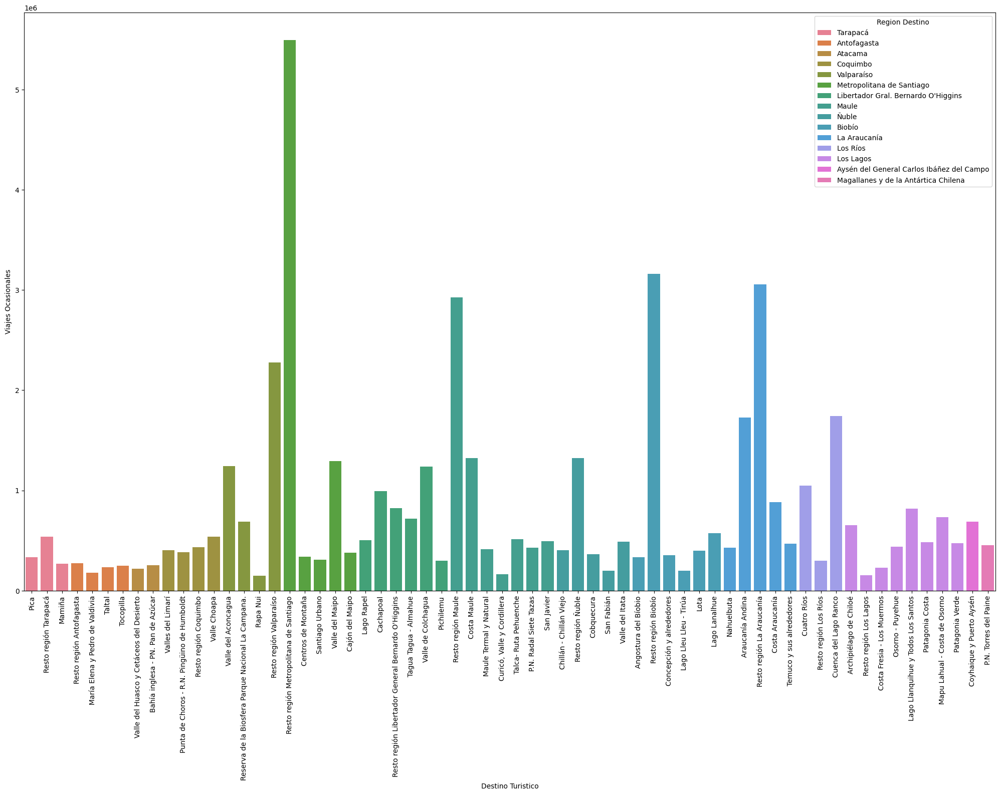

In [165]:
# Viajes Ocasionales por Destino Turistico y Region Destino
df = df.sort_values(by='Norte a Sur Destino',ascending=True)
viajes_por_destino_region = df.groupby(['Destino Turistico', 'Region Destino','Norte a Sur Destino'])['Viajes Ocasionales'].sum().reset_index()
viajes_por_destino_region = viajes_por_destino_region.sort_values(by='Norte a Sur Destino')

plt.figure(figsize=(25, 15))
sns.barplot(data=viajes_por_destino_region, x='Destino Turistico', y='Viajes Ocasionales', hue='Region Destino',order=viajes_por_destino_region['Destino Turistico'])
plt.xticks(rotation=90)

plt.show()

/var/folders/3p/lzyp6b9542b_8mk_q04l5p100000gn/T/ipykernel_1152/3298030776.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfp['Fecha'] = pd.to_datetime(dfp[['Anio', 'CUT Mes']].astype(str).agg('-'.join, axis=1), format='%Y-%m')


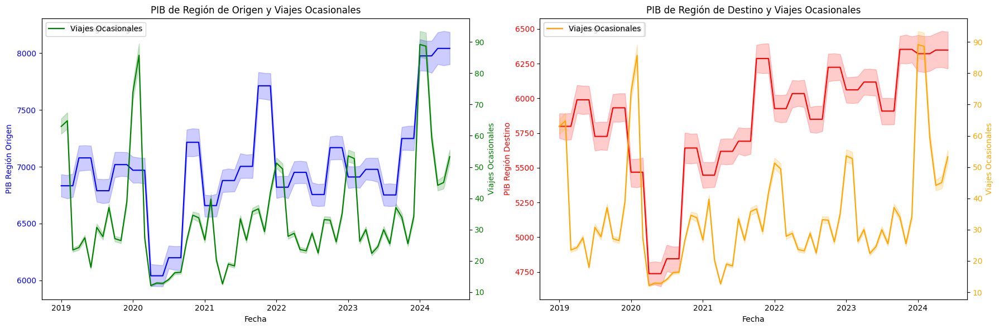

In [129]:
# Comparación de PIB Region Origen y PIB Regions destino con Viajes Ocasionales con respecto al Tiempo

dfp = df[['Anio','CUT Mes','PIB Region Origen', 'PIB Region Destino', 'Viajes Ocasionales']]

# Asegurarnos de que 'Anio' y 'CUT Mes' existan y sean numéricos
dfp['Fecha'] = pd.to_datetime(dfp[['Anio', 'CUT Mes']].astype(str).agg('-'.join, axis=1), format='%Y-%m')

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

# PIB Región Origen y Viajes Ocasionales (ax1)
sns.lineplot(data=dfp, x='Fecha', y='PIB Region Origen', ax=ax1, color='b', label='PIB Región Origen')
ax1.set_ylabel('PIB Región Origen', color='b')
ax1.tick_params(axis='y', labelcolor='b')

# Segundo eje Y para los Viajes Ocasionales 
ax2_1 = ax1.twinx()
sns.lineplot(data=dfp, x='Fecha', y='Viajes Ocasionales', ax=ax2_1, color='g', label='Viajes Ocasionales')
ax2_1.set_ylabel('Viajes Ocasionales', color='g')
ax2_1.tick_params(axis='y', labelcolor='g')

ax1.set_title("PIB de Región de Origen y Viajes Ocasionales")
ax1.set_xlabel('Fecha')

# PIB Región Destino y Viajes Ocasionales en el segundo subplot (ax2)
sns.lineplot(data=dfp, x='Fecha', y='PIB Region Destino', ax=ax2, color='r', label='PIB Región Destino')
ax2.set_ylabel('PIB Región Destino', color='r')
ax2.tick_params(axis='y', labelcolor='r')

# Segundo eje Y para los Viajes Ocasionales
ax2_2 = ax2.twinx()
sns.lineplot(data=dfp, x='Fecha', y='Viajes Ocasionales', ax=ax2_2, color='orange', label='Viajes Ocasionales')
ax2_2.set_ylabel('Viajes Ocasionales', color='orange')
ax2_2.tick_params(axis='y', labelcolor='orange')

ax2.set_title("PIB de Región de Destino y Viajes Ocasionales")
ax2.set_xlabel('Fecha')

plt.tight_layout()

plt.show()


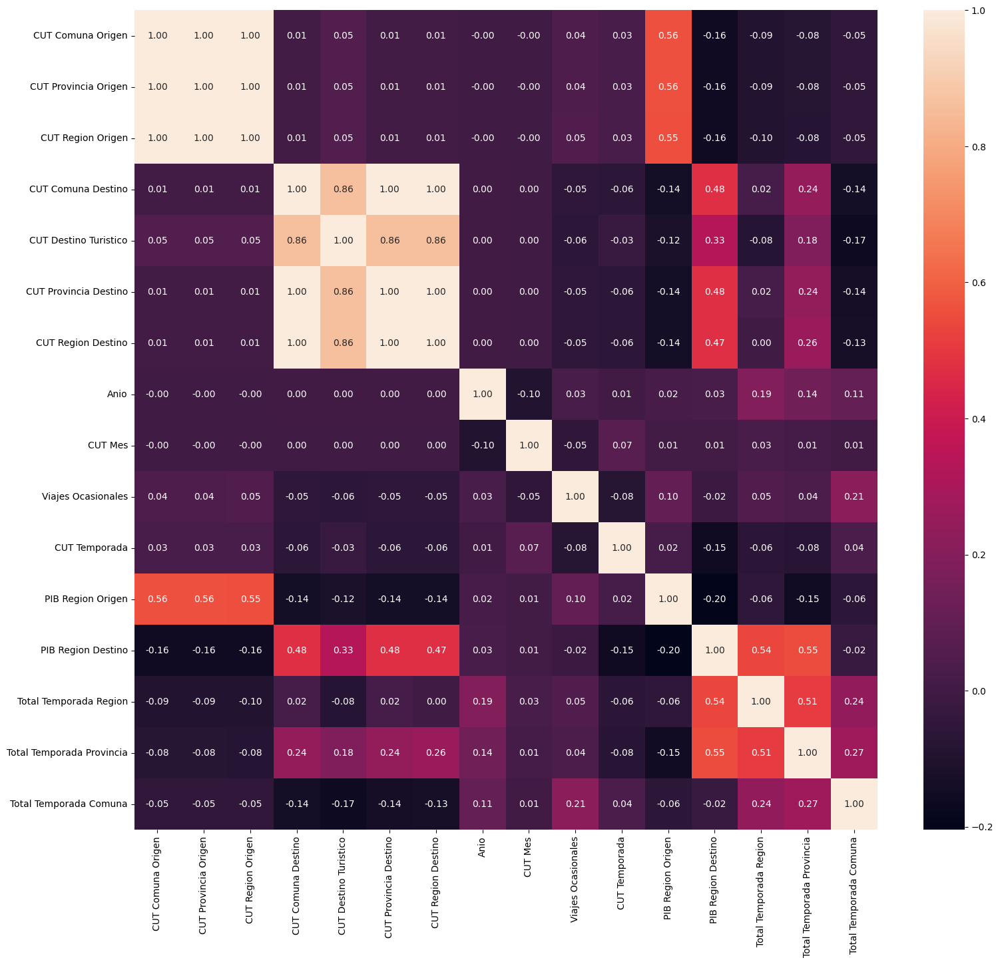

In [ ]:
# Análisis de Correlaciones de todas las variables

df_corr= df.drop(['Comuna Origen', 'Provincia Origen', 'Region Origen', 'Comuna Destino', 'Destino Turistico', 'Provincia Destino', 'Region Destino', 'Mes', 'Temporada'],axis=1)
df_corr

plt.figure(figsize=(18, 16))
sns.heatmap(df_corr.corr(),annot=True,fmt=".2f")
plt.show()

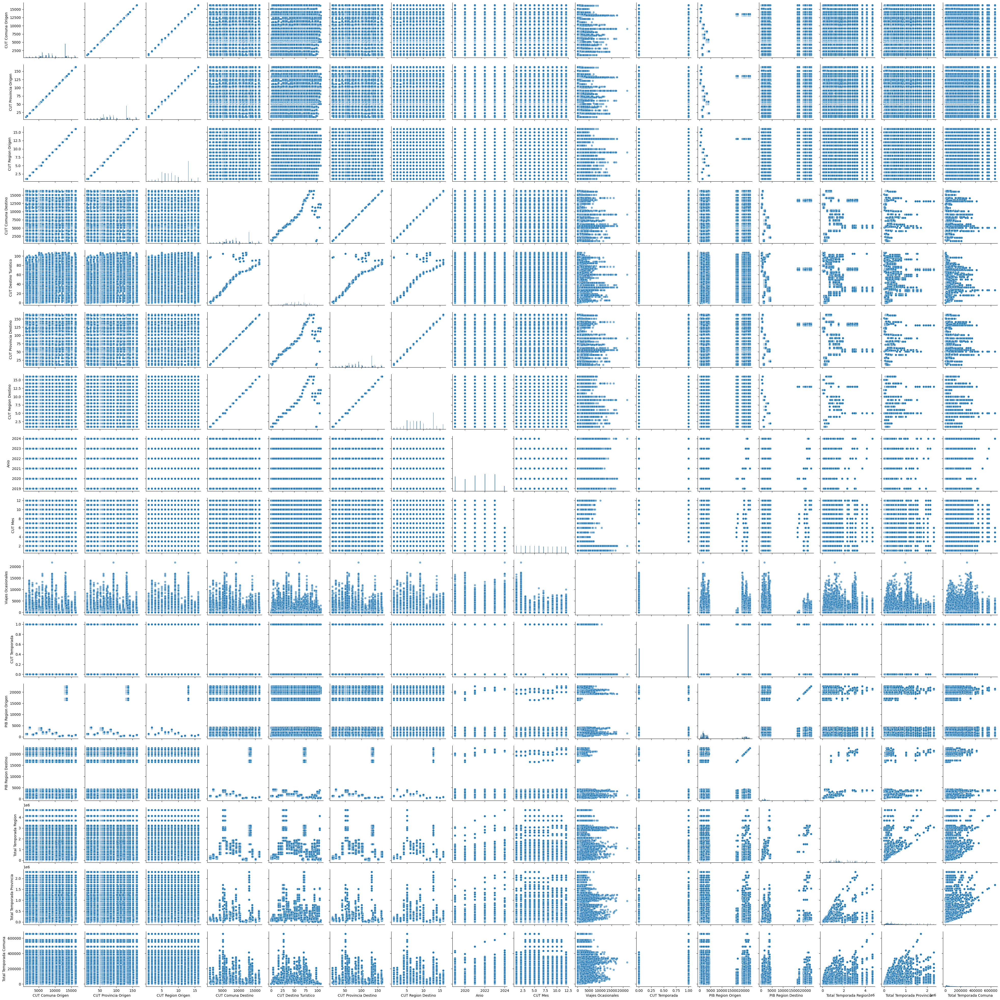

In [ ]:
# Comparativa de todas las variables del DataFrame

sns.pairplot(df_corr, kind='scatter', plot_kws={'alpha': 0.6})
plt.show()

In [210]:
df.columns

Index(['CUT Comuna Origen', 'Comuna Origen', 'CUT Provincia Origen',
       'Provincia Origen', 'CUT Region Origen', 'Region Origen',
       'CUT Comuna Destino', 'Comuna Destino', 'CUT Destino Turistico',
       'Destino Turistico', 'CUT Provincia Destino', 'Provincia Destino',
       'CUT Region Destino', 'Region Destino', 'Anio', 'CUT Mes', 'Mes',
       'Viajes Ocasionales', 'CUT Temporada', 'Temporada', 'PIB Region Origen',
       'PIB Region Destino', 'Norte a Sur Origen', 'Norte a Sur Destino'],
      dtype='object')

In [31]:
# Elimina las columnas 'Destino Turístico' y 'CUT Destino Turístico'
df_prueba = df.drop(columns=['Destino Turistico', 'CUT Destino Turistico'])

# Agrupa el DataFrame por las columnas de origen y destino, además del año y mes
df_prueba = df_prueba.groupby(['CUT Comuna Origen', 'Comuna Origen', 'CUT Provincia Origen', 
                 'Provincia Origen', 'CUT Region Origen', 'Region Origen',
                 'CUT Comuna Destino', 'Comuna Destino', 'CUT Provincia Destino', 
                 'Provincia Destino', 'CUT Region Destino', 'Region Destino', 
                 'Anio', 'CUT Mes', 'Mes', 'CUT Temporada', 'Temporada', 
                 'PIB Region Origen', 'PIB Region Destino', 'Norte a Sur Origen', 'Norte a Sur Destino'], as_index=False).sum()
df_prueba

,CUT Comuna Origen,Comuna Origen,CUT Provincia Origen,Provincia Origen,CUT Region Origen,Region Origen,CUT Comuna Destino,Comuna Destino,CUT Provincia Destino,Provincia Destino,...,Anio,CUT Mes,Mes,CUT Temporada,Temporada,PIB Region Origen,PIB Region Destino,Norte a Sur Origen,Norte a Sur Destino,Viajes Ocasionales
0,1101,Iquique,11,Iquique,1,Tarapacá,2103,Sierra Gorda,21,Antofagasta,...,2019,6,junio,0,Baja,1115.801838,3894.124564,2,3,18
1,1101,Iquique,11,Iquique,1,Tarapacá,2103,Sierra Gorda,21,Antofagasta,...,2020,6,junio,0,Baja,1042.268636,3767.685658,2,3,19
2,1101,Iquique,11,Iquique,1,Tarapacá,2104,Taltal,21,Antofagasta,...,2019,3,marzo,0,Baja,1061.580205,3724.530431,2,3,21
3,1101,Iquique,11,Iquique,1,Tarapacá,2104,Taltal,21,Antofagasta,...,2020,3,marzo,0,Baja,1136.354511,3924.663743,2,3,22
4,1101,Iquique,11,Iquique,1,Tarapacá,2104,Taltal,21,Antofagasta,...,2020,4,abril,0,Baja,1042.268636,3767.685658,2,3,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1137152,16305,San Nicolás,163,Punilla,16,Ñuble,16304,San Fabián,163,Punilla,...,2023,7,julio,1,Alta,737.064697,737.064697,10,10,15
1137153,16305,San Nicolás,163,Punilla,16,Ñuble,16304,San Fabián,163,Punilla,...,2023,8,agosto,0,Baja,737.064697,737.064697,10,10,12
1137154,16305,San Nicolás,163,Punilla,16,Ñuble,16304,San Fabián,163,Punilla,...,2023,10,octubre,0,Baja,833.567298,833.567298,10,10,21
1137155,16305,San Nicolás,163,Punilla,16,Ñuble,16304,San Fabián,163,Punilla,...,2023,11,noviembre,0,Baja,833.567298,833.567298,10,10,15


In [30]:
df_prueba.sort_values(by='Viajes Ocasionales')
df_prueba[['Comuna Origen', 'Comuna Destino','Anio','Mes', 'Viajes Ocasionales']].sort_values(by='Viajes Ocasionales')
df_prueba= df_prueba[df_prueba['Comuna Destino']=='Hualpén']
print(df_prueba.to_string())

         CUT Comuna Origen         Comuna Origen  CUT Provincia Origen         Provincia Origen  CUT Region Origen                              Region Origen  CUT Comuna Destino Comuna Destino  CUT Provincia Destino Provincia Destino  CUT Region Destino Region Destino  Anio  CUT Mes         Mes  CUT Temporada Temporada  PIB Region Origen  PIB Region Destino  Norte a Sur Origen  Norte a Sur Destino  Viajes Ocasionales
3648                  1101               Iquique                    11                  Iquique                  1                                   Tarapacá                8112        Hualpén                     81        Concepción                   8         Biobío  2019        1       enero              1      Alta        1061.580205         2756.752875                   2                   11                  56
3649                  1101               Iquique                    11                  Iquique                  1                                   Tarapacá 

In [7]:
# Ingeniría de Características

df.describe()

,CUT Comuna Origen,CUT Provincia Origen,CUT Region Origen,CUT Comuna Destino,CUT Destino Turistico,CUT Provincia Destino,CUT Region Destino,Anio,CUT Mes,Viajes Ocasionales,CUT Temporada,PIB Region Origen,PIB Region Destino,Norte a Sur Origen,Norte a Sur Destino
count,1.488834e+06,1.488834e+06,1.488834e+06,1.488834e+06,1.488834e+06,1.488834e+06,1.488834e+06,1.488834e+06,1.488834e+06,1.488834e+06,1.488834e+06,1.488834e+06,1.488834e+06,1.488834e+06,1.488834e+06
mean,9.386431e+03,9.379671e+01,9.165190e+00,9.502809e+03,3.227844e+01,9.495734e+01,9.276148e+00,2.021315e+03,6.321830e+00,3.349875e+01,3.485392e-01,6.980195e+03,5.854280e+03,8.577370e+00,9.253193e+00
std,3.740828e+03,3.738857e+01,3.767233e+00,3.534884e+03,1.416685e+01,3.533429e+01,3.572661e+00,1.532413e+00,3.447453e+00,1.035299e+02,4.765079e-01,8.177546e+03,7.650961e+03,2.859089e+00,2.912163e+00
min,1.101000e+03,1.100000e+01,1.000000e+00,1.107000e+03,0.000000e+00,1.100000e+01,1.000000e+00,2.019000e+03,1.000000e+00,1.000000e+00,0.000000e+00,2.697575e+02,2.697575e+02,1.000000e+00,2.000000e+00
25%,6.117000e+03,6.100000e+01,6.000000e+00,7.108000e+03,2.100000e+01,7.100000e+01,7.000000e+00,2.020000e+03,3.000000e+00,5.000000e+00,0.000000e+00,1.581916e+03,1.478858e+03,7.000000e+00,7.000000e+00
50%,9.101000e+03,9.100000e+01,9.000000e+00,9.110000e+03,3.200000e+01,9.100000e+01,9.000000e+00,2.021000e+03,6.000000e+00,1.100000e+01,0.000000e+00,2.636094e+03,1.976570e+03,8.000000e+00,9.000000e+00
75%,1.312000e+04,1.310000e+02,1.300000e+01,1.311300e+04,4.100000e+01,1.310000e+02,1.300000e+01,2.023000e+03,9.000000e+00,2.900000e+01,1.000000e+00,1.717111e+04,3.686928e+03,1.100000e+01,1.200000e+01
max,1.630500e+04,1.630000e+02,1.600000e+01,1.630400e+04,6.300000e+01,1.630000e+02,1.600000e+01,2.024000e+03,1.200000e+01,1.194800e+04,1.000000e+00,2.261309e+04,2.261309e+04,1.600000e+01,1.600000e+01


Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x107cc01d0>>
Traceback (most recent call last):
  File "/Users/luiscamacho/VSCProjects/.venv/lib/python3.11/site-packages/ipykernel/ipkernel.py", line 775, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(

KeyboardInterrupt: 


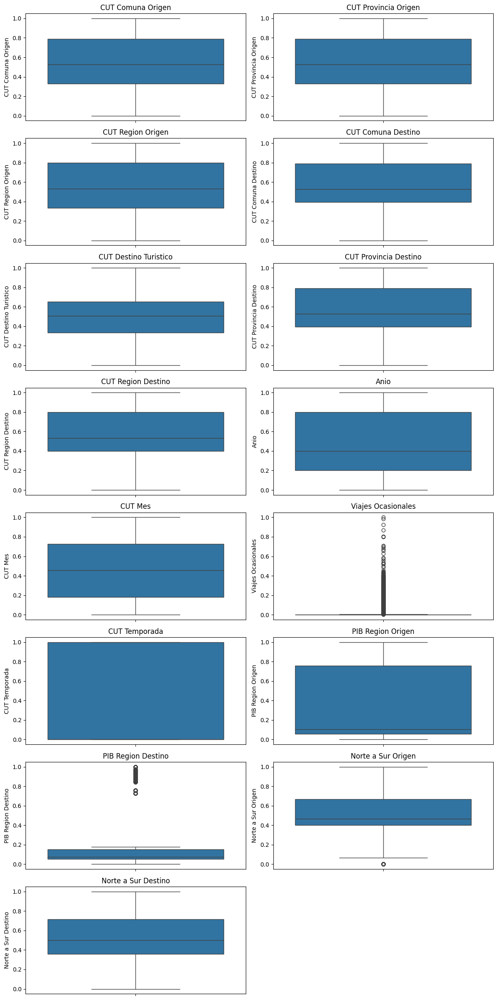

In [243]:
def plot_numerical_boxplots(df):
  
    numerical_cols = df.select_dtypes(include=['number']).columns
    num_plots = len(numerical_cols)
    
    n_cols = 2 
    n_rows = (num_plots + n_cols - 1) // n_cols
    
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 3 * n_rows))
    axes = axes.flatten()

    for i, col in enumerate(numerical_cols):
      sns.boxplot(y=df[col], ax=axes[i])
      axes[i].set_title(f'{col}')

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

plot_numerical_boxplots(df)

In [14]:
# Análisis Outliers en la variable 'Viajes Ocasionales'

def analisis_ric(columna,df):
    estadisticas = df[columna].describe()
    ric = estadisticas['75%'] - estadisticas['25%']
    lim_sup = estadisticas['75%'] + 1.5*ric
    lim_inf = estadisticas['25%'] - 1.5*ric
    print(f'\nRango Intercuratílico: {ric}')
    print(f'Límite superior: {lim_sup} \nLímite inferior: {lim_inf}')

print(df['Viajes Ocasionales'].describe())

col_a_analizar = 'Viajes Ocasionales'

analisis_ric(col_a_analizar,df)

print('\n',df[df[col_a_analizar]>=65].count())
print('\n',df[df[col_a_analizar]<15].count())

count    1.488834e+06
mean     3.349875e+01
std      1.035299e+02
min      1.000000e+00
25%      5.000000e+00
50%      1.100000e+01
75%      2.900000e+01
max      1.194800e+04
Name: Viajes Ocasionales, dtype: float64

Rango Intercuratílico: 24.0
Límite superior: 65.0 
Límite inferior: -31.0

 CUT Comuna Origen        163547
Comuna Origen            163547
CUT Provincia Origen     163547
Provincia Origen         163547
CUT Region Origen        163547
Region Origen            163547
CUT Comuna Destino       163547
Comuna Destino           163547
CUT Destino Turistico    163547
Destino Turistico        163547
CUT Provincia Destino    163547
Provincia Destino        163547
CUT Region Destino       163547
Region Destino           163547
Anio                     163547
CUT Mes                  163547
Mes                      163547
Viajes Ocasionales       163547
CUT Temporada            163547
Temporada                163547
PIB Region Origen        163547
PIB Region Destino       163547
No

In [9]:
# Análisis Outliers en la variable 'PIB Region Destino'
col_a_analizar = 'PIB Region Destino'

print(df[col_a_analizar].describe())

analisis_ric(col_a_analizar,df)

print('\n',df[df[col_a_analizar]>=2067].count())
print('\n',df[df[col_a_analizar]<2].count())

count    1.488834e+06
mean     5.854280e+03
std      7.650961e+03
min      2.697575e+02
25%      1.478858e+03
50%      1.976570e+03
75%      3.686928e+03
max      2.261309e+04
Name: PIB Region Destino, dtype: float64

Rango Intercuratílico: 2208.0709347762
Límite superior: 6999.0348489199 
Límite inferior: -1833.2488901848997

 CUT Comuna Origen        702186
Comuna Origen            702186
CUT Provincia Origen     702186
Provincia Origen         702186
CUT Region Origen        702186
Region Origen            702186
CUT Comuna Destino       702186
Comuna Destino           702186
CUT Destino Turistico    702186
Destino Turistico        702186
CUT Provincia Destino    702186
Provincia Destino        702186
CUT Region Destino       702186
Region Destino           702186
Anio                     702186
CUT Mes                  702186
Mes                      702186
Viajes Ocasionales       702186
CUT Temporada            702186
Temporada                702186
PIB Region Origen        70218

In [ ]:
# Análisis Outliers en la variable 'Total Temporada Region'
col_a_analizar = 'Total Temporada Region'

print(df[col_a_analizar].describe())

analisis_ric(col_a_analizar,df)

print('\n',df[df[col_a_analizar]>=4000000].count())
print('\n',df[df[col_a_analizar]<0].count())

count    2.952624e+06
mean     1.599657e+06
std      1.010350e+06
min      2.603800e+04
25%      8.698860e+05
50%      1.324967e+06
75%      2.316071e+06
max      4.664627e+06
Name: Total Temporada Region, dtype: float64

Rango Intercuratílico: 1446185.0
Límite superior: 4485348.5 
Límite inferior: -1299391.5

 CUT Comuna Origen            115108
Comuna Origen                115108
CUT Provincia Origen         115108
Provincia Origen             115108
CUT Region Origen            115108
Region Origen                115108
CUT Comuna Destino           115108
Comuna Destino               115108
CUT Destino Turistico        115108
Destino Turistico            115108
CUT Provincia Destino        115108
Provincia Destino            115108
CUT Region Destino           115108
Region Destino               115108
Anio                         115108
CUT Mes                      115108
Mes                          115108
Viajes Ocasionales           115108
CUT Temporada                115108
Tem

In [ ]:
# Análisis Outliers en la variable 'Total Temporada Provincia'
col_a_analizar = 'Total Temporada Provincia'

print(df[col_a_analizar].describe())

analisis_ric(col_a_analizar,df)

print('\n',df[df[col_a_analizar]>=200000].count())
print('\n',df[df[col_a_analizar]<0].count())

count    2.952624e+06
mean     6.123443e+05
std      5.708988e+05
min      1.860000e+02
25%      1.919040e+05
50%      3.895310e+05
75%      8.339650e+05
max      2.296075e+06
Name: Total Temporada Provincia, dtype: float64

Rango Intercuratílico: 642061.0
Límite superior: 1797056.5 
Límite inferior: -771187.5

 CUT Comuna Origen            2173763
Comuna Origen                2173763
CUT Provincia Origen         2173763
Provincia Origen             2173763
CUT Region Origen            2173763
Region Origen                2173763
CUT Comuna Destino           2173763
Comuna Destino               2173763
CUT Destino Turistico        2173763
Destino Turistico            2173763
CUT Provincia Destino        2173763
Provincia Destino            2173763
CUT Region Destino           2173763
Region Destino               2173763
Anio                         2173763
CUT Mes                      2173763
Mes                          2173763
Viajes Ocasionales           2173763
CUT Temporada       

In [ ]:
# Análisis Outliers en la variable 'Total Temporada Comuna'
col_a_analizar = 'Total Temporada Comuna'

print(df[col_a_analizar].describe())

analisis_ric(col_a_analizar,df)

print('\n',df[df[col_a_analizar]>=200000].count())
print('\n',df[df[col_a_analizar]<0].count())

count    2.952624e+06
mean     6.544223e+04
std      7.630416e+04
min      7.000000e+01
25%      1.936700e+04
50%      3.719000e+04
75%      7.514000e+04
max      6.559690e+05
Name: Total Temporada Comuna, dtype: float64

Rango Intercuratílico: 55773.0
Límite superior: 158799.5 
Límite inferior: -64292.5

 CUT Comuna Origen            213520
Comuna Origen                213520
CUT Provincia Origen         213520
Provincia Origen             213520
CUT Region Origen            213520
Region Origen                213520
CUT Comuna Destino           213520
Comuna Destino               213520
CUT Destino Turistico        213520
Destino Turistico            213520
CUT Provincia Destino        213520
Provincia Destino            213520
CUT Region Destino           213520
Region Destino               213520
Anio                         213520
CUT Mes                      213520
Mes                          213520
Viajes Ocasionales           213520
CUT Temporada                213520
Temporad